In [1]:
import pandas as pd
import numpy as np
import h5py
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import savgol_filter
from IPython import display
plt.style.use('seaborn')

file_name = "data/210414_BNP_transect2/BNP_data_collection_210414.h5"
h5_file = h5py.File(file_name, "r")

In [2]:
inserts1 = list(h5_file['session002/cal001'].keys())
vis_waves = h5_file['session001/cal001'].attrs['spec1_wavelengths_vector'][:]
ftir_waves = h5_file['session001/cal001'].attrs['spec2_wavelengths_vector'][:]

In [3]:
depth_min = -0.2
depth_max = 90.0

def normalize_depth(depth):
    return (depth - depth_min) / (depth_max - depth_min)

# Transect 2: proceeding down the hillslope, visible light spectrometer

4/14/21

Insertions are done down the hillslope towards the low spot next to the forest.

The calibration curve for the visible light spectrometer was lower than normal.

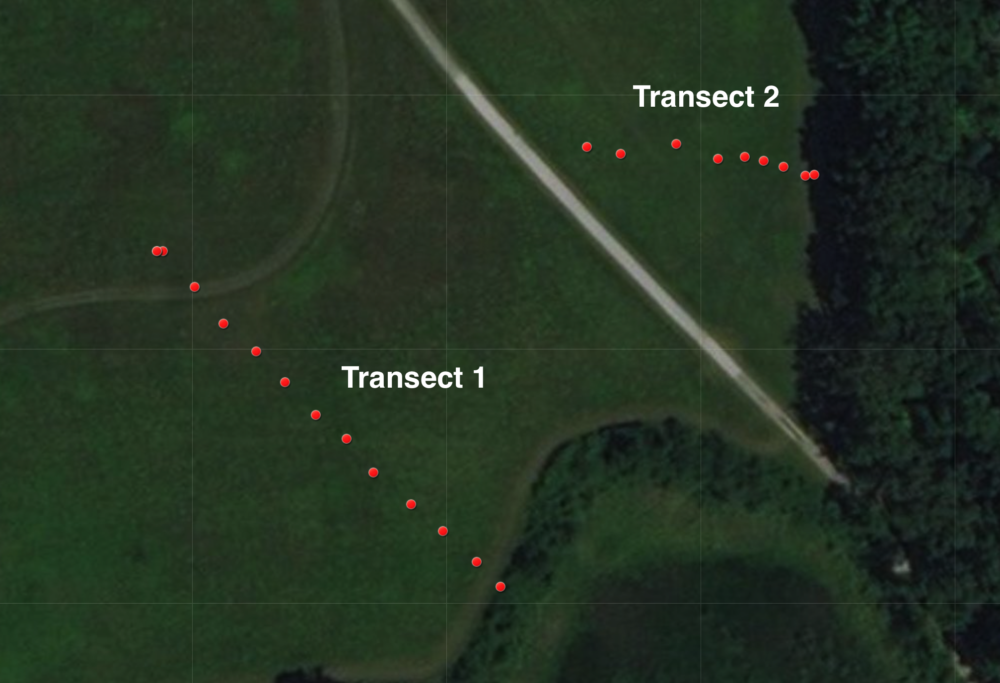

In [4]:
display.Image("data/Screen Shot 2021-04-16 at 1.16.29 PM.png")

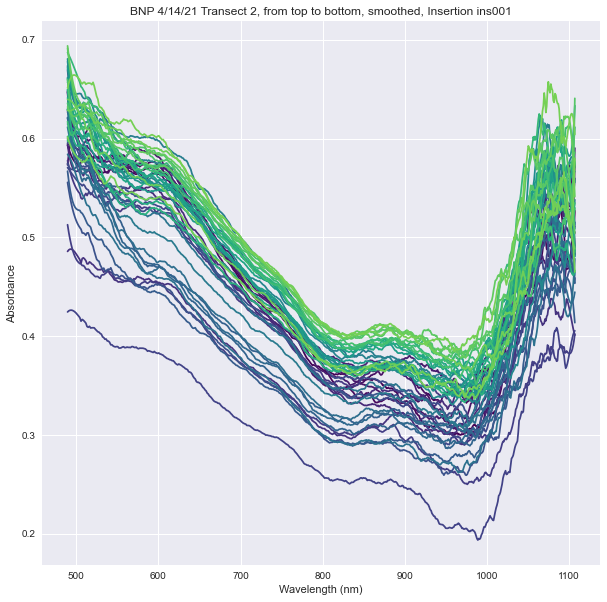

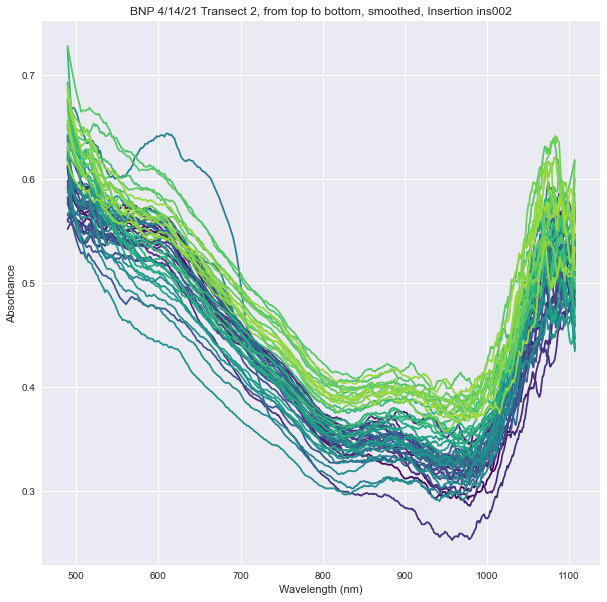

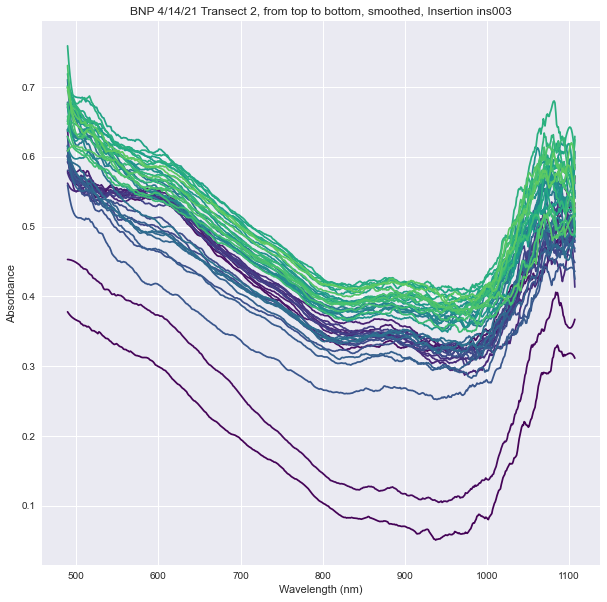

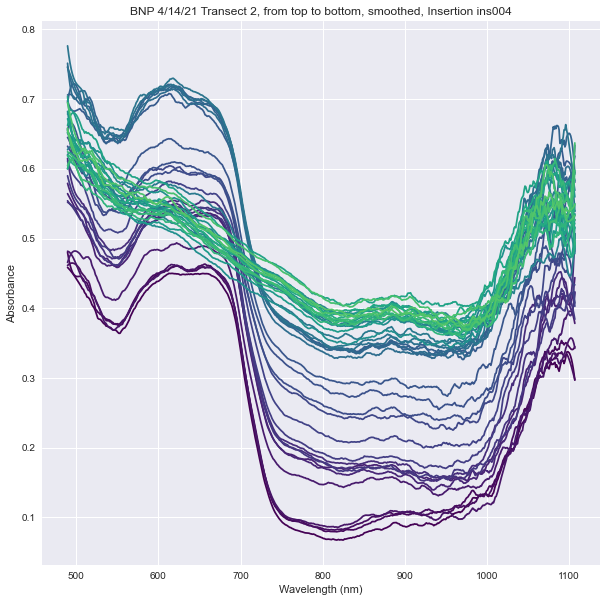

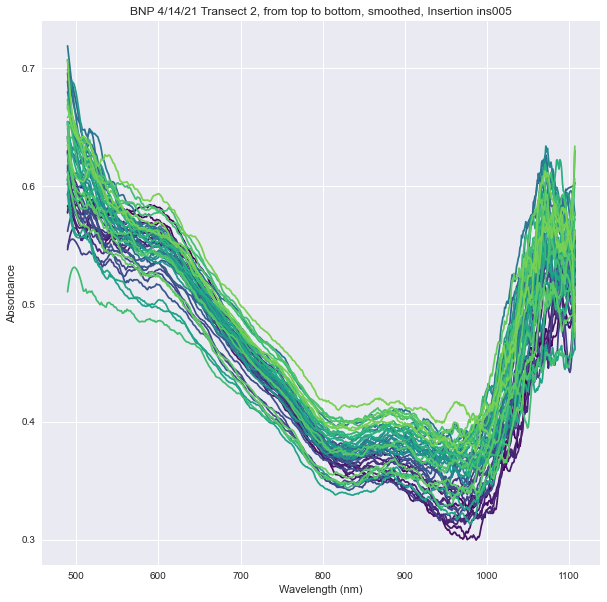

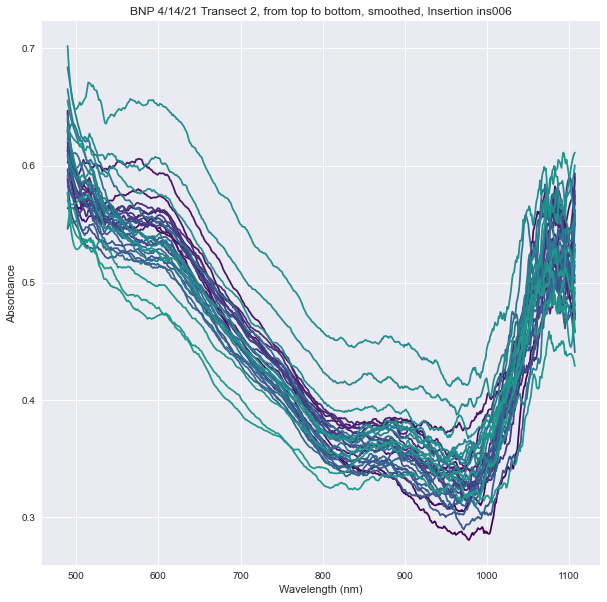

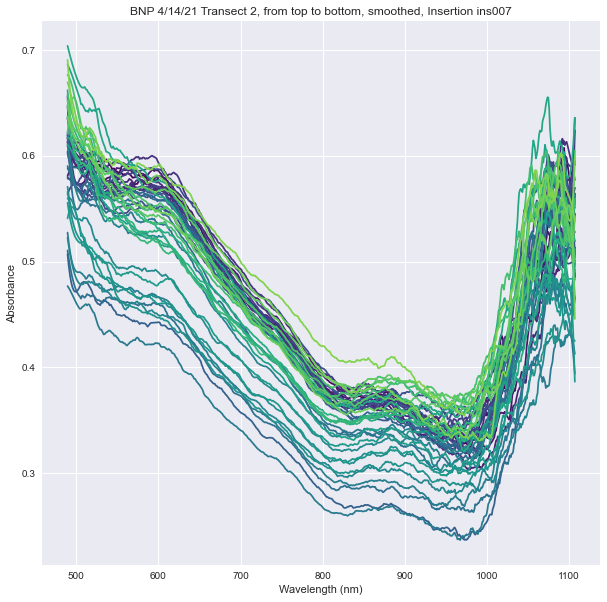

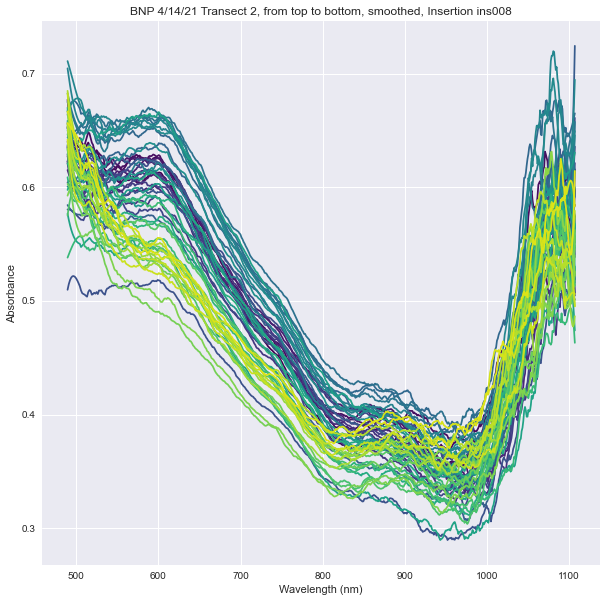

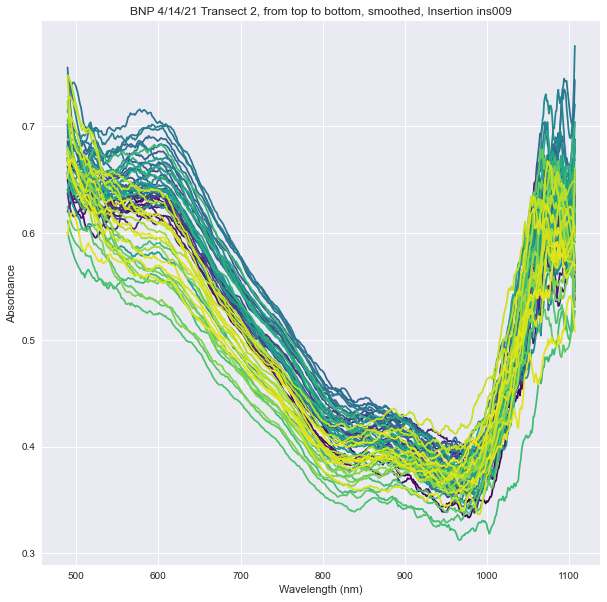

In [5]:
for insert in inserts1:
    ins_abs_all = h5_file[f'session002/cal001/{insert}/derived/absorbance_depth'][:, :512]
    ins_depths = h5_file[f'session002/cal001/{insert}/derived/absorbance_depth'][:, -1]
    ins_abs = ins_abs_all[ins_depths > 6.0]
    fix, ax = plt.subplots(figsize=(10,10))
    ax.set_title(f"BNP 4/14/21 Transect 2, from top to bottom, smoothed, Insertion {insert}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Wavelength (nm)")
    for i in range (ins_abs.shape[0]):
        color = plt.cm.viridis(normalize_depth(ins_depths[i]))
        ax.plot(vis_waves, savgol_filter(ins_abs[i, :], 21, 3), color=color)
    plt.show()
    plt.close()

# Transect2, from bottom of hill towards the top, visible light spectrometer

4/14/21

We re-calibrated the spectrometers and then re-did the same locations, but this time from the low area towards the top of the hill.




In [6]:
inserts2 = list(h5_file['session002/cal002'].keys())

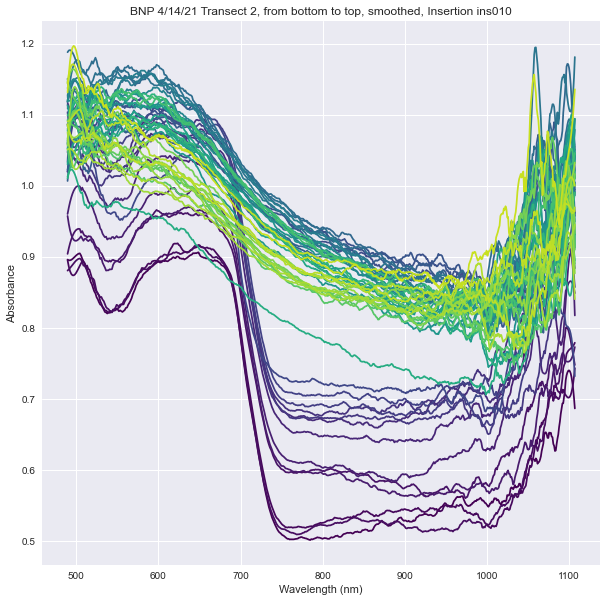

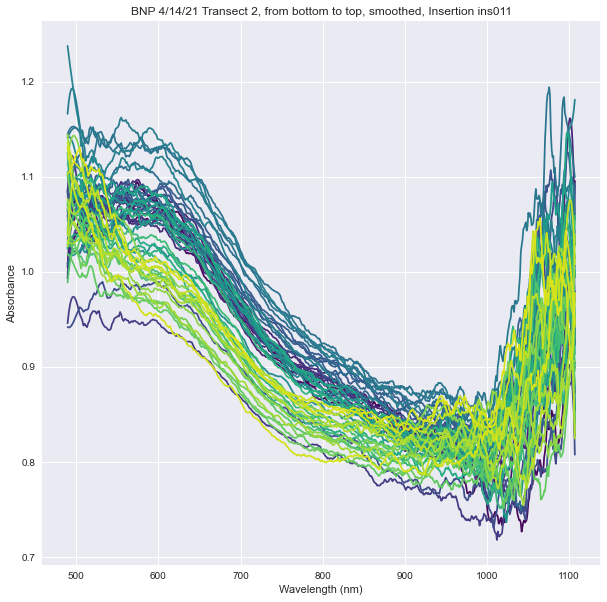

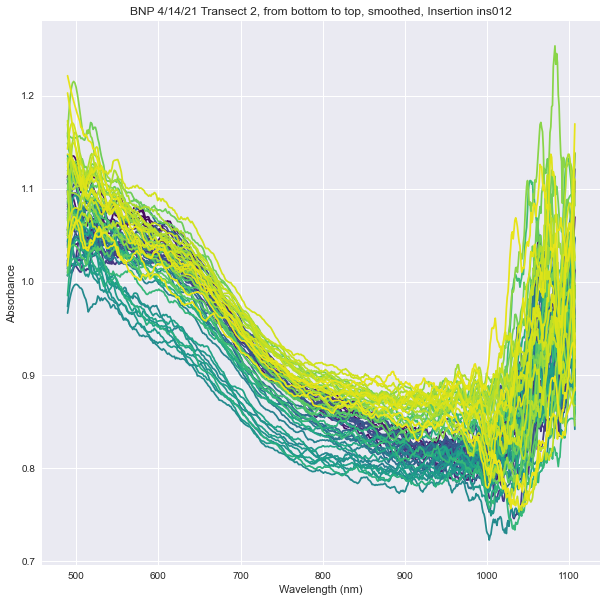

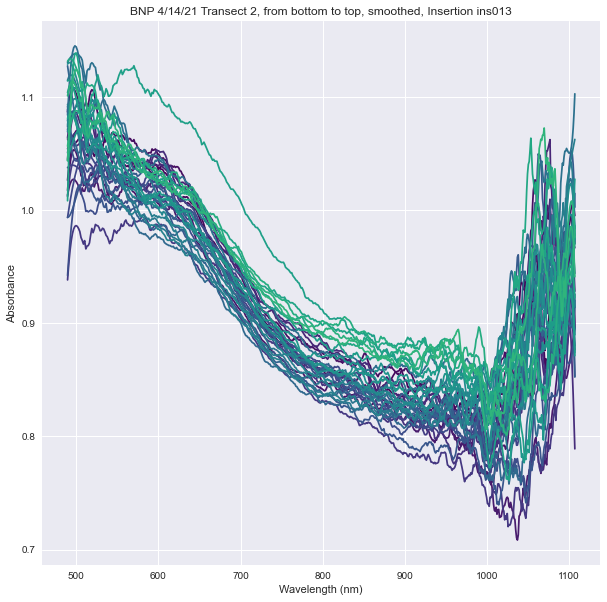

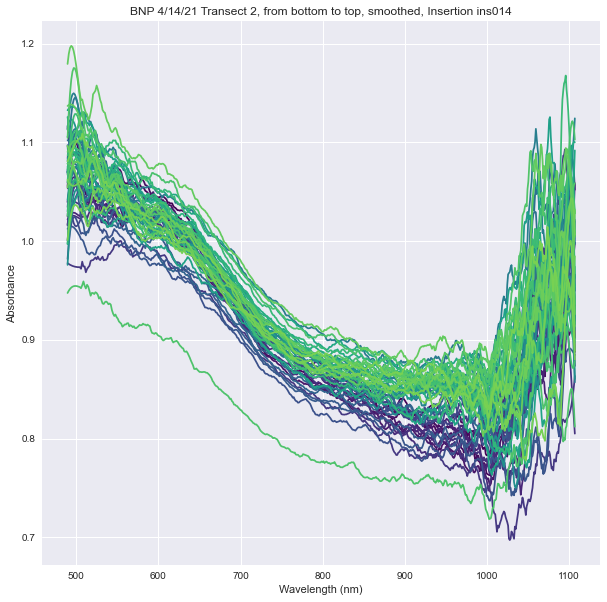

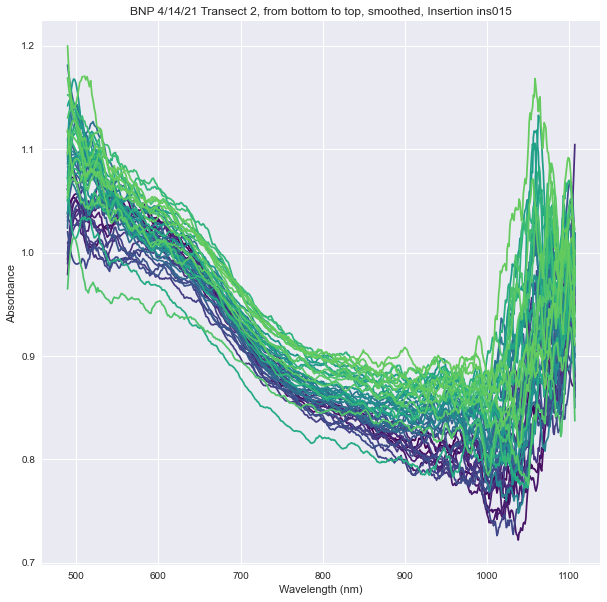

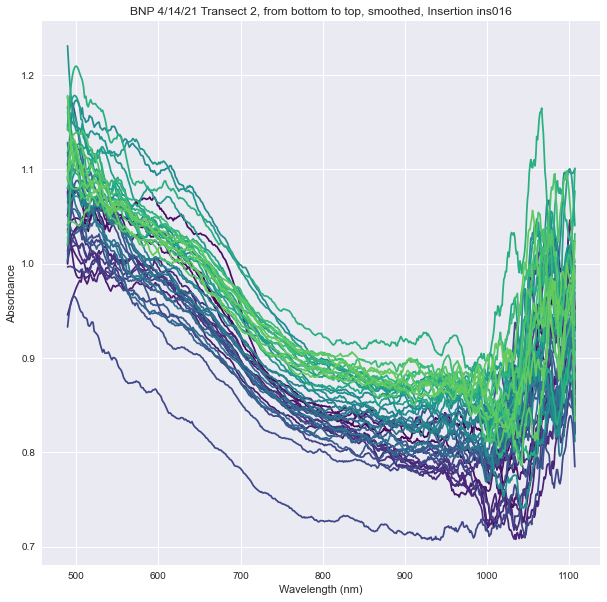

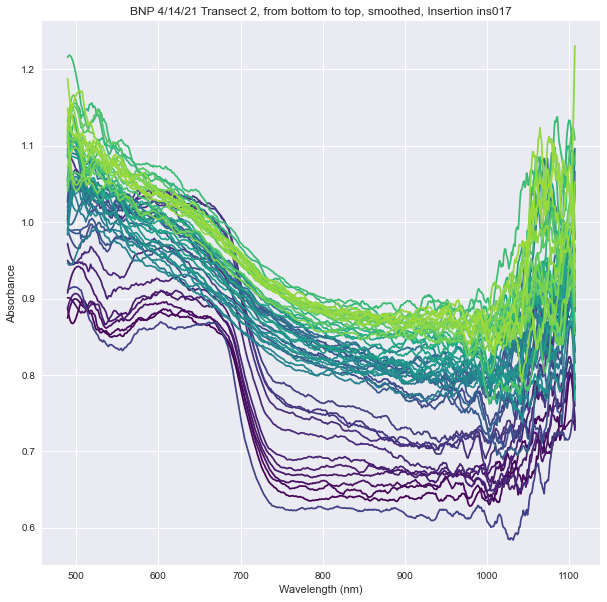

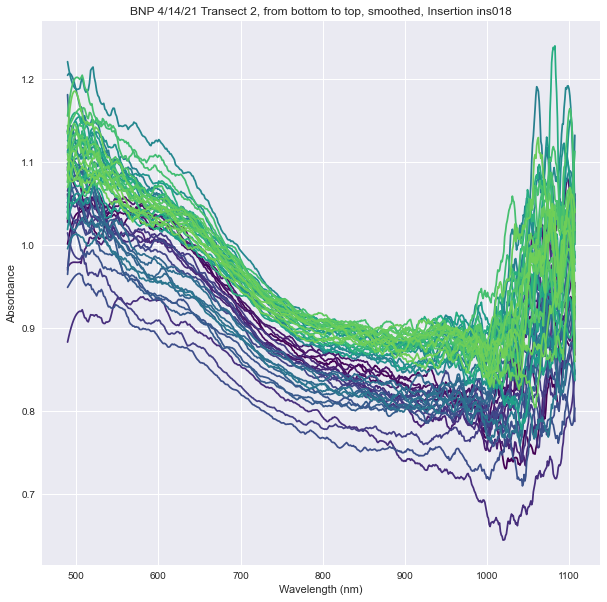

In [7]:
for insert in inserts2:
    ins_abs_all = h5_file[f'session002/cal002/{insert}/derived/absorbance_depth'][:, :512]
    ins_depths = h5_file[f'session002/cal002/{insert}/derived/absorbance_depth'][:, -1]
    ins_abs = ins_abs_all[ins_depths > 6.0]
    fix, ax = plt.subplots(figsize=(10,10))
    ax.set_title(f"BNP 4/14/21 Transect 2, from bottom to top, smoothed, Insertion {insert}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Wavelength (nm)")
    for i in range (ins_abs.shape[0]):
        color = plt.cm.viridis(normalize_depth(ins_depths[i]))
        ax.plot(vis_waves, savgol_filter(ins_abs[i, :], 21, 3), color=color)
    plt.show()
    plt.close()

## Two more insertions at top of hill after recalibrating.

We recalibrated the spectrometers again, this time getting a very low calibration curve.  We did two insertions at the first flag in the transect using this low calibration curve.

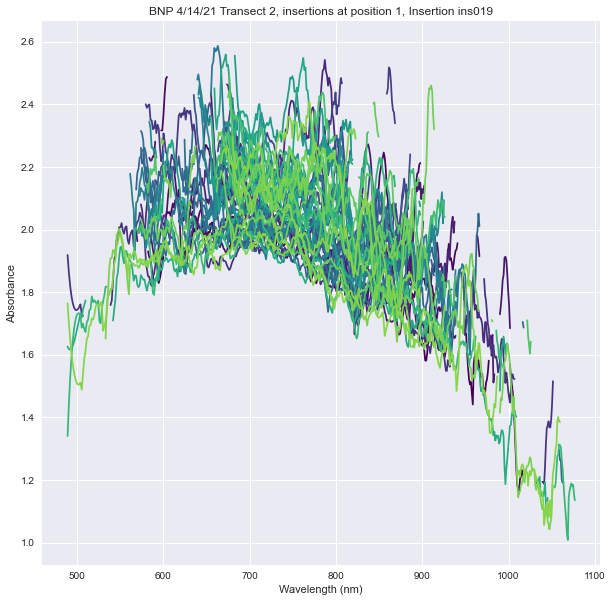

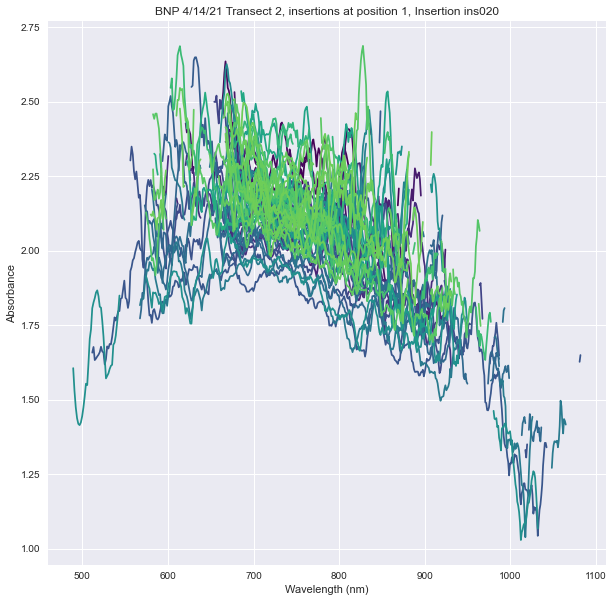

In [8]:
inserts3 = list(h5_file['session002/cal005'].keys())
for insert in inserts3:
    ins_abs_all = h5_file[f'session002/cal005/{insert}/derived/absorbance_depth'][:, :512]
    ins_depths = h5_file[f'session002/cal005/{insert}/derived/absorbance_depth'][:, -1]
    ins_abs = ins_abs_all[ins_depths > 6.0]
    fix, ax = plt.subplots(figsize=(10,10))
    ax.set_title(f"BNP 4/14/21 Transect 2, insertions at position 1, Insertion {insert}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Wavelength (nm)")
    for i in range (ins_abs.shape[0]):
        color = plt.cm.viridis(normalize_depth(ins_depths[i]))
        ax.plot(vis_waves, savgol_filter(ins_abs[i, :], 21, 3), color=color)
    plt.show()
    plt.close()

# Transect 2 from top of hill to bottom, FTIR engine.

Same transect, but with the FTIR engine, proceeding from the highest elevation towards the lowest.

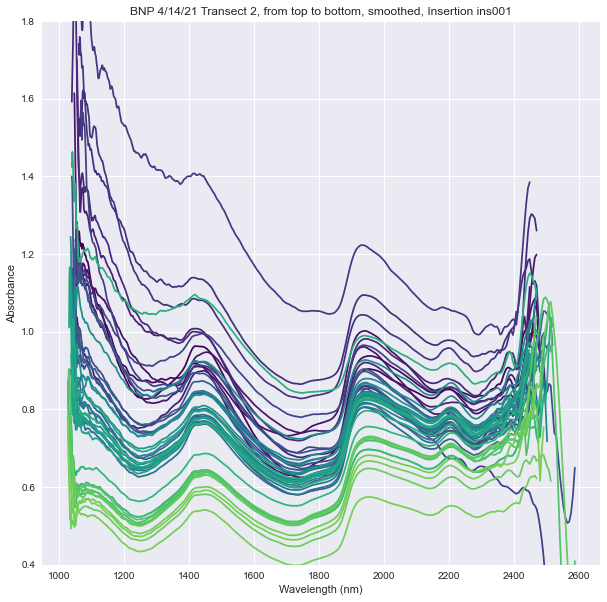

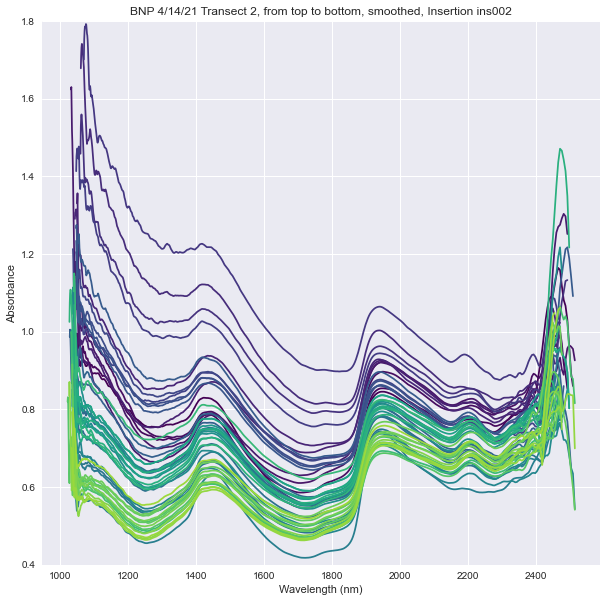

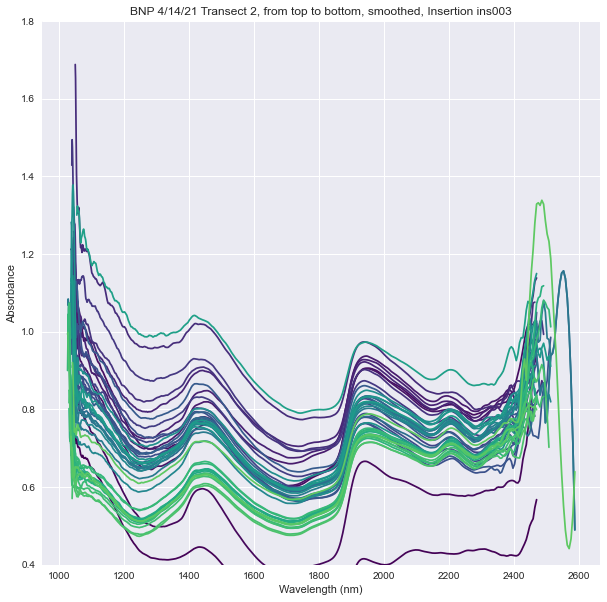

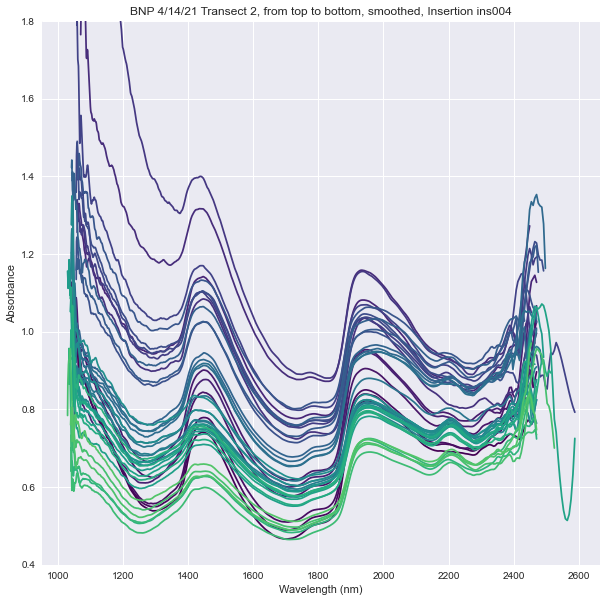

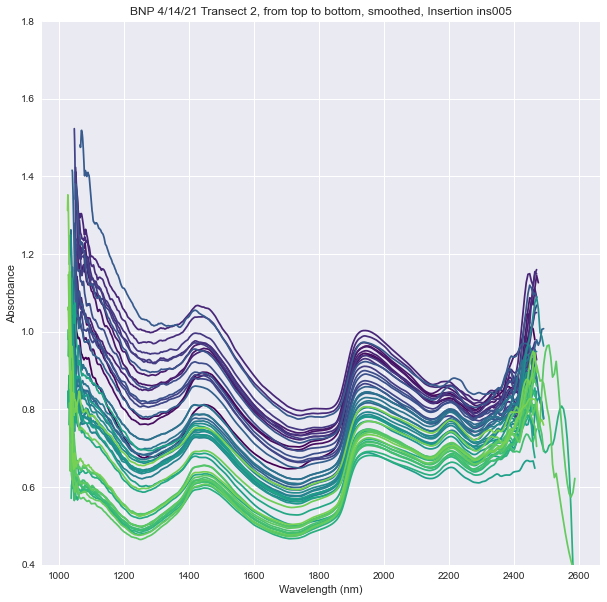

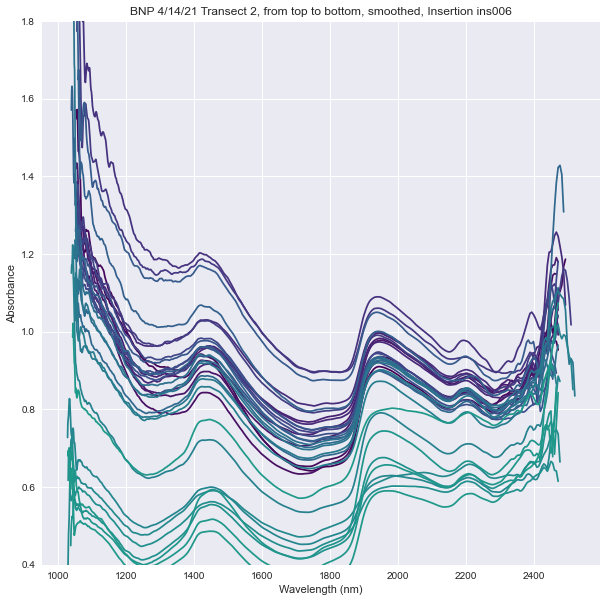

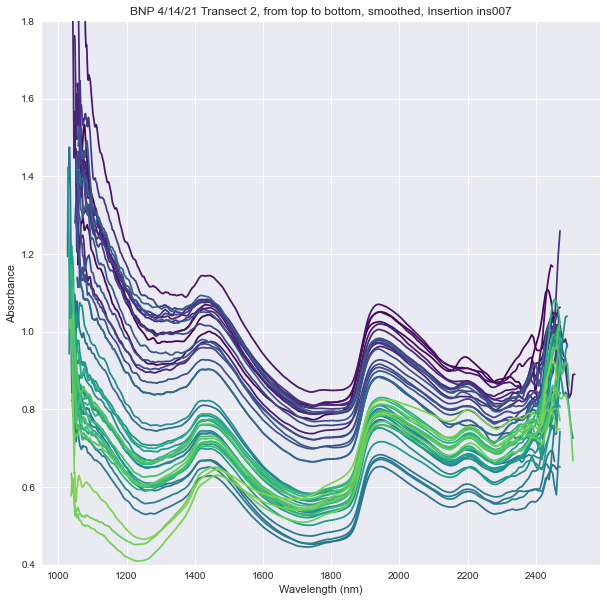

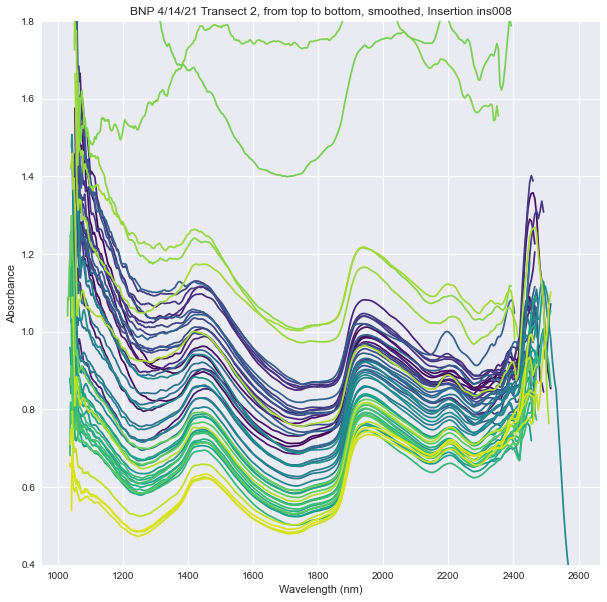

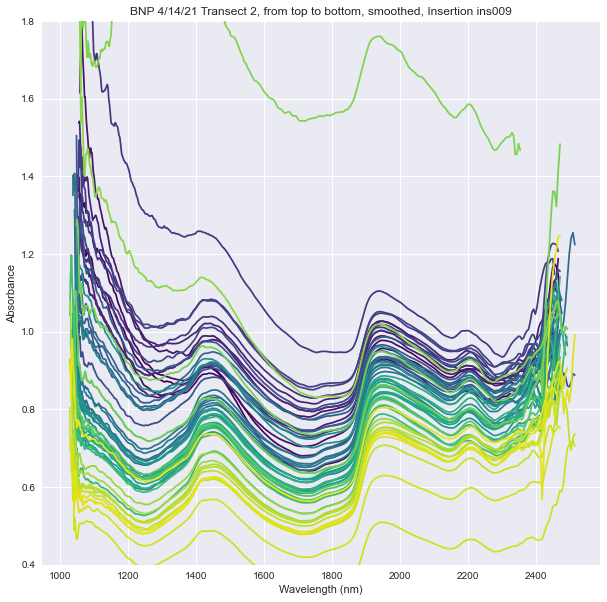

In [9]:
for insert in inserts1:
    ins_abs_all = h5_file[f'session002/cal001/{insert}/derived/absorbance_depth'][:, 512:-2]
    ins_depths = h5_file[f'session002/cal001/{insert}/derived/absorbance_depth'][:, -1]
    ins_abs = ins_abs_all[ins_depths > 6.0]
    fix, ax = plt.subplots(figsize=(10,10))
    ax.set_title(f"BNP 4/14/21 Transect 2, from top to bottom, smoothed, Insertion {insert}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Wavelength (nm)")
    ax.set_ylim(0.4, 1.8)
    for i in range (ins_abs.shape[0]):
        color = plt.cm.viridis(normalize_depth(ins_depths[i]))
        ax.plot(ftir_waves, savgol_filter(ins_abs[i, :], 21, 3), color=color)
    plt.show()
    plt.close()

# Transect 2 from bottom of hill to top, FTIR engine

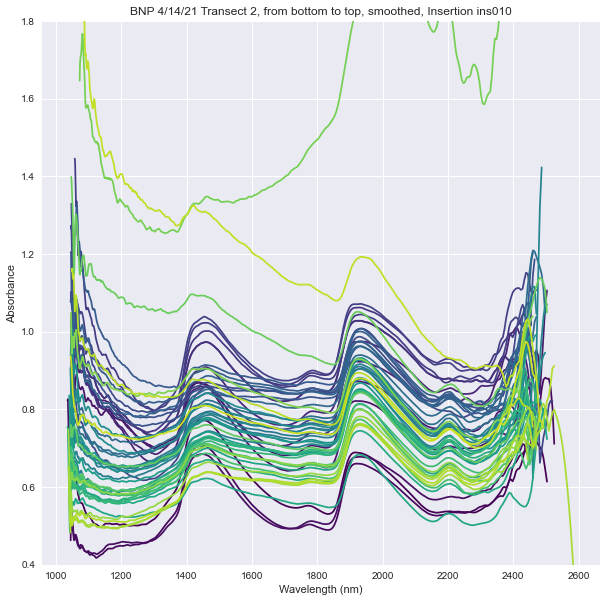

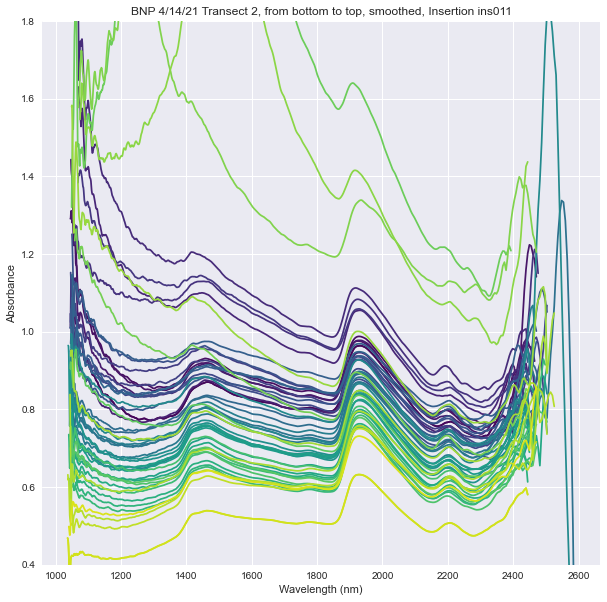

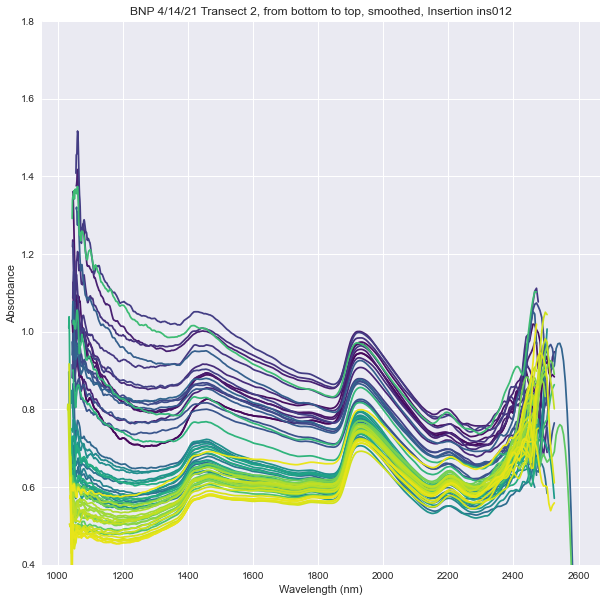

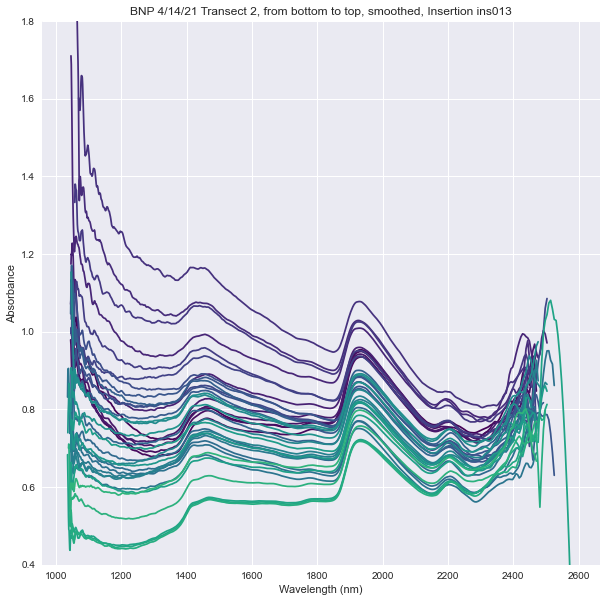

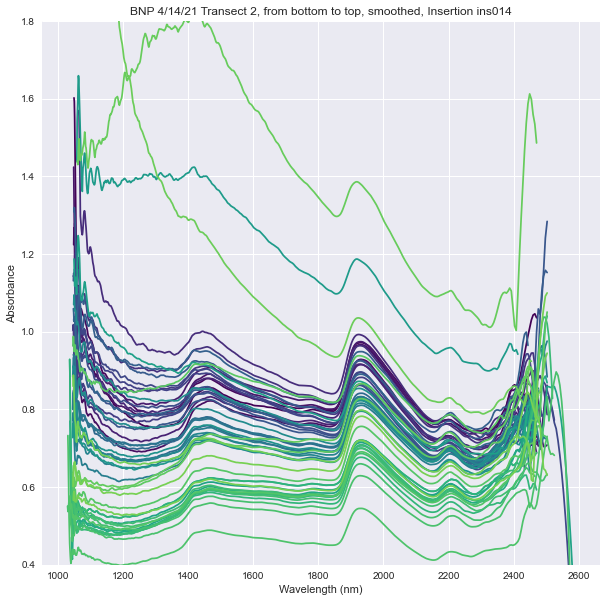

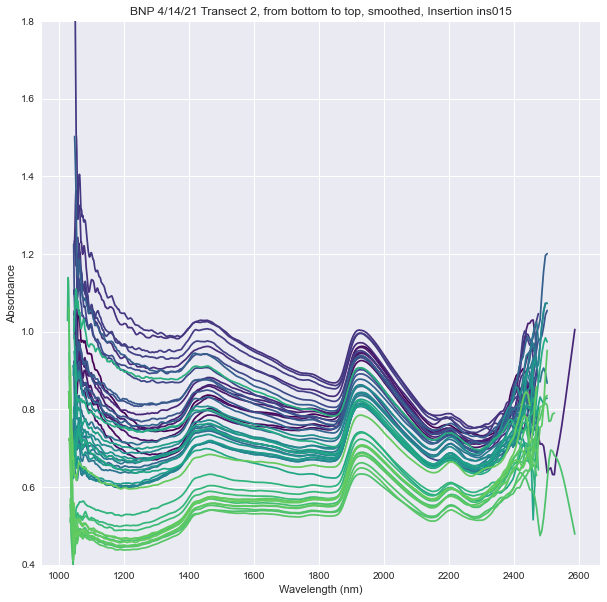

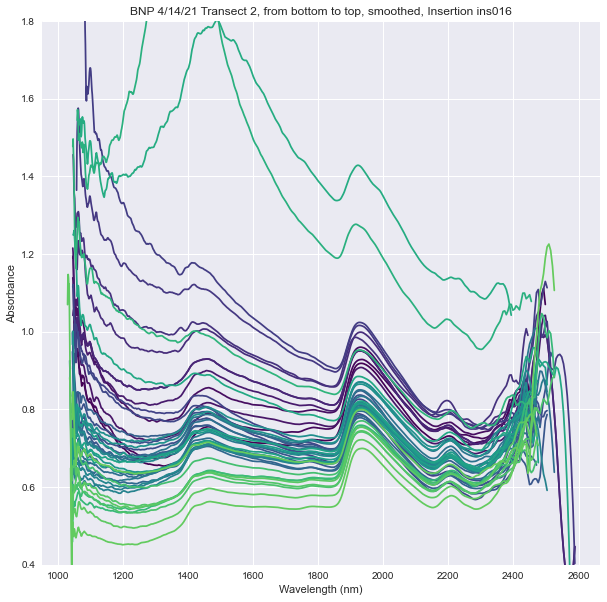

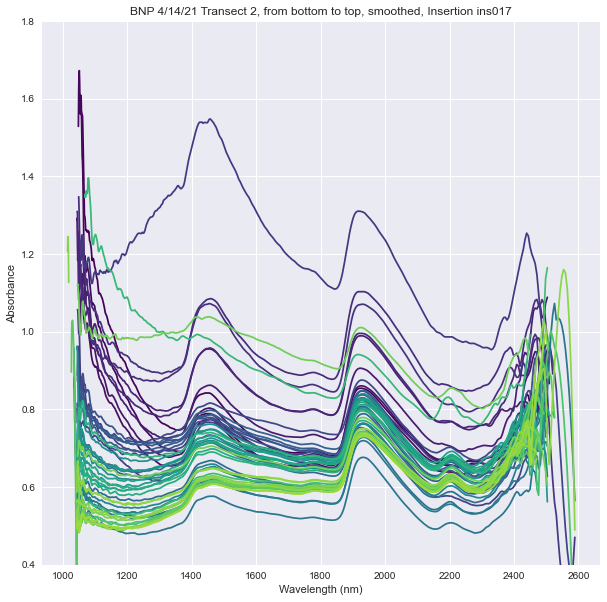

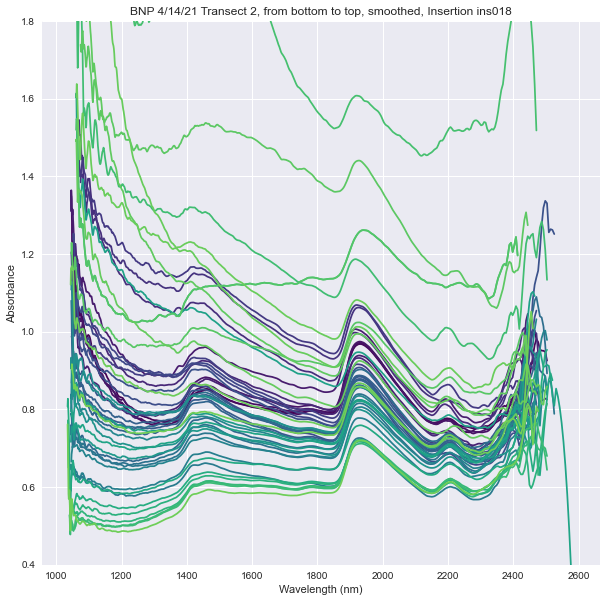

In [10]:
for insert in inserts2:
    ins_abs_all = h5_file[f'session002/cal002/{insert}/derived/absorbance_depth'][:, 512:-2]
    ins_depths = h5_file[f'session002/cal002/{insert}/derived/absorbance_depth'][:, -1]
    ins_abs = ins_abs_all[ins_depths > 6.0]
    fix, ax = plt.subplots(figsize=(10,10))
    ax.set_title(f"BNP 4/14/21 Transect 2, from bottom to top, smoothed, Insertion {insert}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Wavelength (nm)")
    ax.set_ylim(0.4, 1.8)
    for i in range (ins_abs.shape[0]):
        color = plt.cm.viridis(normalize_depth(ins_depths[i]))
        ax.plot(ftir_waves, savgol_filter(ins_abs[i, :], 21, 3), color=color)
    plt.show()
    plt.close()

### Two insertions at top of hill after recalibrating, FTIR Engine

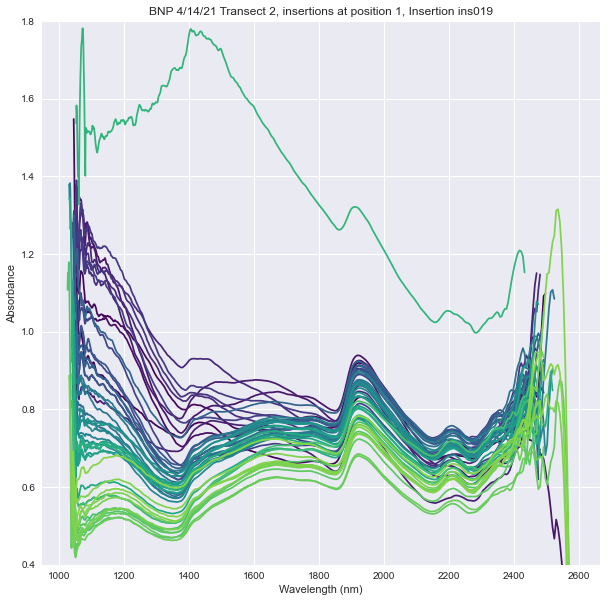

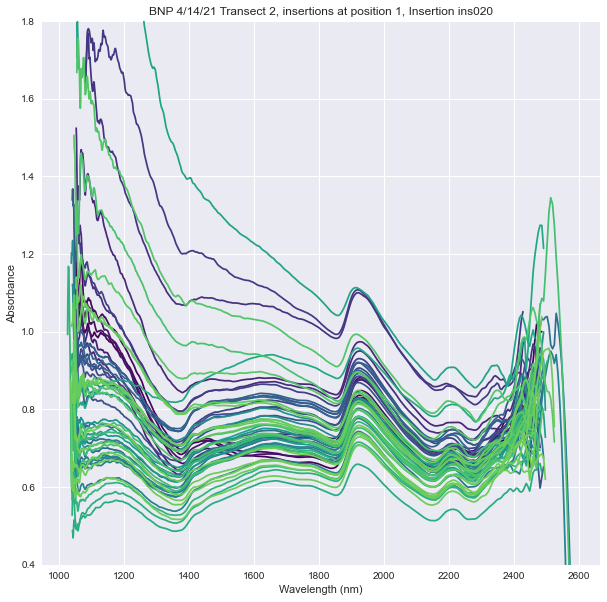

In [11]:
for insert in inserts3:
    ins_abs_all = h5_file[f'session002/cal005/{insert}/derived/absorbance_depth'][:, 512:-2]
    ins_depths = h5_file[f'session002/cal005/{insert}/derived/absorbance_depth'][:, -1]
    ins_abs = ins_abs_all[ins_depths > 6.0]
    fix, ax = plt.subplots(figsize=(10,10))
    ax.set_title(f"BNP 4/14/21 Transect 2, insertions at position 1, Insertion {insert}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Wavelength (nm)")
    ax.set_ylim(0.4, 1.8)
    for i in range (ins_abs.shape[0]):
        color = plt.cm.viridis(normalize_depth(ins_depths[i]))
        ax.plot(ftir_waves, savgol_filter(ins_abs[i, :], 21, 3), color=color)
    plt.show()
    plt.close()

# Calibration curves

In [12]:
def create_list_of_items_in_node(item_type, h5_file, node):
    keys = []
    if item_type == "group":
        my_type = h5py._hl.group.Group
    if item_type == "dataset":
        my_type = h5py._hl.dataset.Dataset
    h5_file[node].visit(lambda key: keys.append(key) if type(h5_file[node][key]) is my_type else None)
    return keys

def create_list_of_calibrations_in_node(h5_file, node):
    calibrations = []
    all_groups = create_list_of_items_in_node("group", h5_file, node)
    for group in all_groups:
        if group[-6:-3] == 'cal':
            calibrations.append(group)
    return calibrations

In [13]:
calibrations = create_list_of_calibrations_in_node(h5_file, '/')

In [14]:
calibrations

['session001/cal001',
 'session001/cal002',
 'session001/cal003',
 'session001/cal004',
 'session002/cal001',
 'session002/cal002',
 'session002/cal003',
 'session002/cal004',
 'session002/cal005',
 'session002/cal006']

In [15]:
cal_top_to_bottom = 'session002/cal001'
cal_bottom_to_top = 'session002/cal002'
cal_third_group = 'session002/cal005'

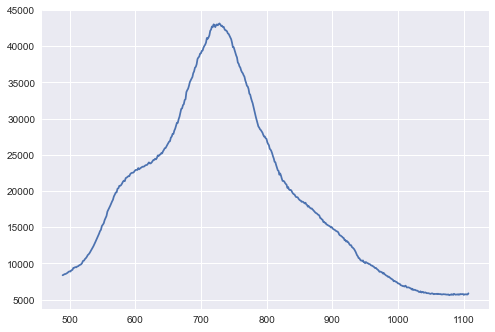

In [16]:
spectrum = h5_file[cal_top_to_bottom].attrs['white_spectrum'][:]
plt.plot(vis_waves, spectrum)


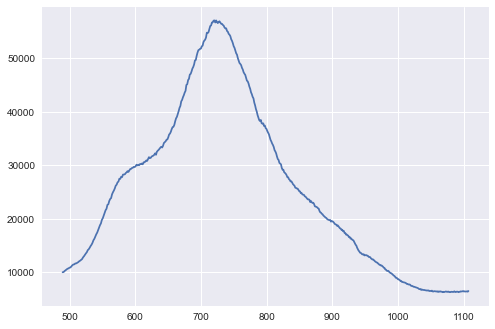

In [17]:
spectrum = h5_file[cal_bottom_to_top].attrs['white_spectrum'][:]
plt.plot(vis_waves, spectrum)

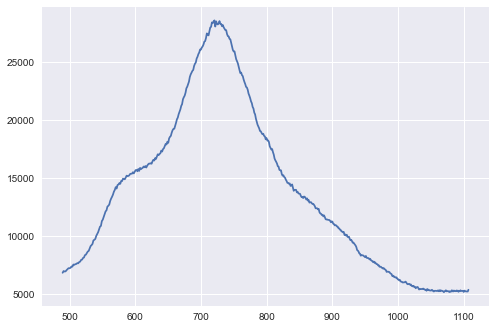

In [18]:
spectrum = h5_file[cal_third_group].attrs['white_spectrum'][:]
plt.plot(vis_waves, spectrum)

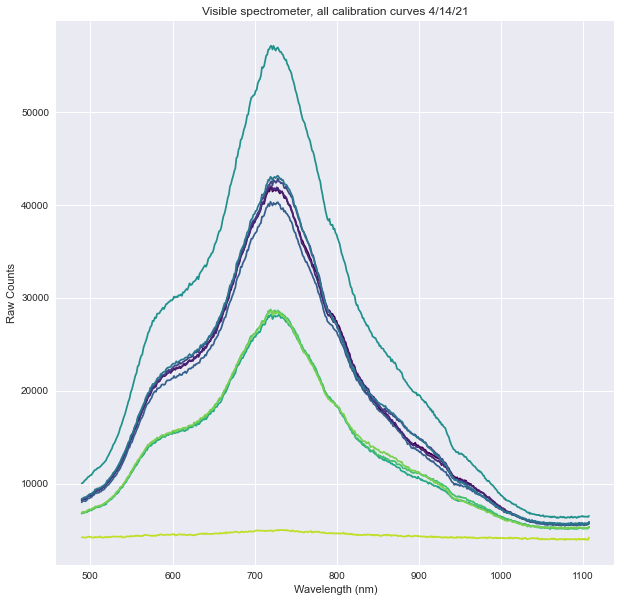

In [19]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_title("Visible spectrometer, all calibration curves 4/14/21")
ax.set_ylabel("Raw Counts")
ax.set_xlabel("Wavelength (nm)")
#ax.set_ylim(10000, 30000)
for calibration in calibrations:
    index_value = calibrations.index(calibration)
    color = plt.cm.viridis(index_value/len(calibrations))
    spectrum = h5_file[calibration].attrs['white_spectrum'][:]
    ax.plot(vis_waves, spectrum, color=color)
    

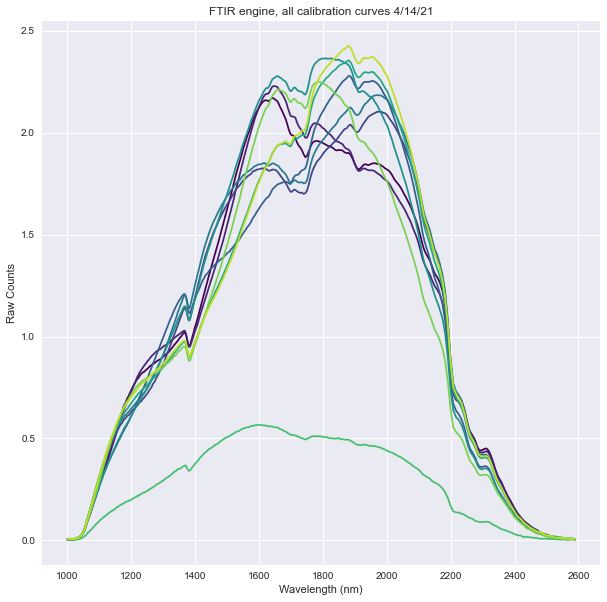

In [20]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_title("FTIR engine, all calibration curves 4/14/21")
ax.set_ylabel("Raw Counts")
ax.set_xlabel("Wavelength (nm)")
#ax.set_ylim(10000, 30000)
for calibration in calibrations:
    index_value = calibrations.index(calibration)
    color = plt.cm.viridis(index_value/len(calibrations))
    spectrum = h5_file[calibration].attrs['white_spectrum2'][:]
    ax.plot(ftir_waves, spectrum, color=color)

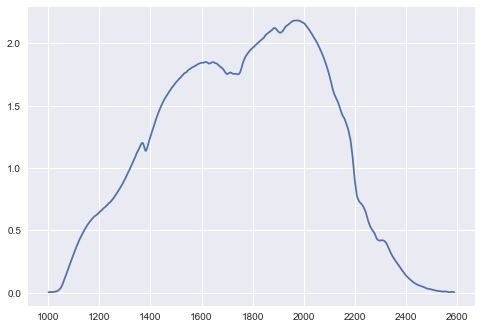

In [21]:
spectrum = h5_file[cal_top_to_bottom].attrs['white_spectrum2'][:]
plt.plot(ftir_waves, spectrum)

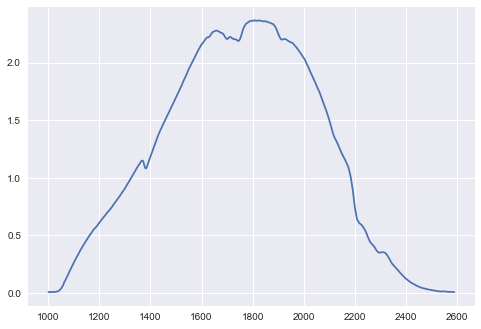

In [22]:
spectrum = h5_file[cal_bottom_to_top].attrs['white_spectrum2'][:]
plt.plot(ftir_waves, spectrum)

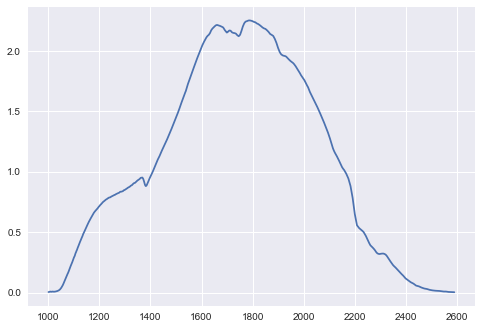

In [23]:
spectrum = h5_file[cal_third_group].attrs['white_spectrum2'][:]
plt.plot(ftir_waves, spectrum)

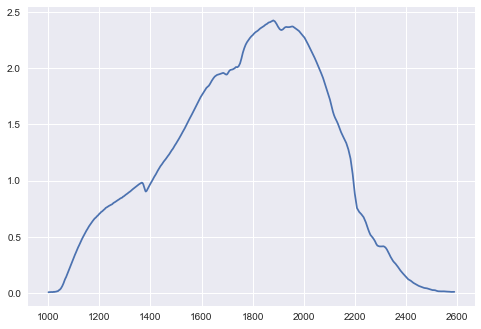

In [24]:
spectrum = h5_file[calibrations[-1]].attrs['white_spectrum2'][:]
plt.plot(ftir_waves, spectrum)

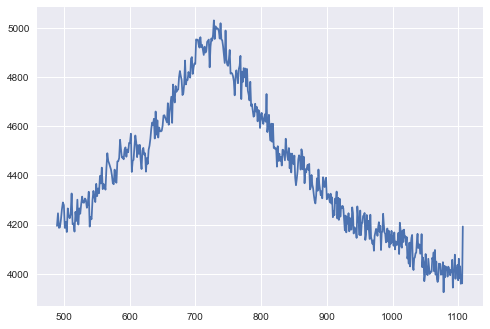

In [25]:
spectrum = h5_file[calibrations[-1]].attrs['white_spectrum'][:]
plt.plot(vis_waves, spectrum)

In [26]:
h5_file.close()